In [1]:
import os
import cv2
import pandas as pd
import numpy as np
import tensorflow as tf
import torch
import segmentation_models_pytorch.utils as utils
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Dropout, Conv2DTranspose, concatenate
from tensorflow.keras.models import Model
from tensorflow.keras.metrics import MeanIoU
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import LearningRateScheduler
from tensorflow.keras.models import load_model
from sklearn.model_selection import train_test_split
from tensorflow.keras.applications import VGG16
from PIL import Image
import matplotlib.pyplot as plt

e:\Python\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# Define UNet architecture
def unet(input_size=(None, None, 3)):
    inputs = Input(input_size)
    
    # Contracting path
    conv1 = Conv2D(64, 3, activation='relu', padding='same')(inputs)
    conv1 = Conv2D(64, 3, activation='relu', padding='same')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = Conv2D(128, 3, activation='relu', padding='same')(pool1)
    conv2 = Conv2D(128, 3, activation='relu', padding='same')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = Conv2D(256, 3, activation='relu', padding='same')(pool2)
    conv3 = Conv2D(256, 3, activation='relu', padding='same')(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

    conv4 = Conv2D(512, 3, activation='relu', padding='same')(pool3)
    conv4 = Conv2D(512, 3, activation='relu', padding='same')(conv4)
    drop4 = Dropout(0.5)(conv4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(drop4)

    conv5 = Conv2D(1024, 3, activation='relu', padding='same')(pool4)
    conv5 = Conv2D(1024, 3, activation='relu', padding='same')(conv5)
    drop5 = Dropout(0.5)(conv5)

    # Expansive path
    up6 = Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(drop5)
    up6 = concatenate([up6, drop4], axis=3)
    conv6 = Conv2D(512, 3, activation='relu', padding='same')(up6)
    conv6 = Conv2D(512, 3, activation='relu', padding='same')(conv6)

    up7 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(conv6)
    up7 = concatenate([up7, conv3], axis=3)
    conv7 = Conv2D(256, 3, activation='relu', padding='same')(up7)
    conv7 = Conv2D(256, 3, activation='relu', padding='same')(conv7)

    up8 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conv7)
    up8 = concatenate([up8, conv2], axis=3)
    conv8 = Conv2D(128, 3, activation='relu', padding='same')(up8)
    conv8 = Conv2D(128, 3, activation='relu', padding='same')(conv8)

    up9 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv8)
    up9 = concatenate([up9, conv1], axis=3)
    conv9 = Conv2D(64, 3, activation='relu', padding='same')(up9)
    conv9 = Conv2D(64, 3, activation='relu', padding='same')(conv9)

    outputs = Conv2D(1, 1, activation='sigmoid')(conv9)  # Sigmoid activation for binary classification

    model = Model(inputs=[inputs], outputs=[outputs])

    return model


In [3]:
def unet_with_vgg16(input_size=(256, 256, 3)):
    inputs = Input(input_size)
    
    # Load VGG16 with pre-trained ImageNet weights
    vgg16 = VGG16(include_top=False, weights='imagenet', input_tensor=inputs)
    
    # Freeze the VGG16 layers
    for layer in vgg16.layers:
        layer.trainable = False
    
    # Use VGG16's layers in the contracting path
    conv1 = vgg16.get_layer("block1_conv2").output
    pool1 = vgg16.get_layer("block1_pool").output

    conv2 = vgg16.get_layer("block2_conv2").output
    pool2 = vgg16.get_layer("block2_pool").output

    conv3 = vgg16.get_layer("block3_conv3").output
    pool3 = vgg16.get_layer("block3_pool").output

    conv4 = vgg16.get_layer("block4_conv3").output
    pool4 = vgg16.get_layer("block4_pool").output

    conv5 = vgg16.get_layer("block5_conv3").output
    
    # Expansive path
    up6 = Conv2DTranspose(512, (2, 2), strides=(2, 2), padding='same')(conv5)
    up6 = concatenate([up6, conv4], axis=3)
    conv6 = Conv2D(512, 3, activation='relu', padding='same')(up6)
    conv6 = Conv2D(512, 3, activation='relu', padding='same')(conv6)

    up7 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(conv6)
    up7 = concatenate([up7, conv3], axis=3)
    conv7 = Conv2D(256, 3, activation='relu', padding='same')(up7)
    conv7 = Conv2D(256, 3, activation='relu', padding='same')(conv7)

    up8 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(conv7)
    up8 = concatenate([up8, conv2], axis=3)
    conv8 = Conv2D(128, 3, activation='relu', padding='same')(up8)
    conv8 = Conv2D(128, 3, activation='relu', padding='same')(conv8)

    up9 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(conv8)
    up9 = concatenate([up9, conv1], axis=3)
    conv9 = Conv2D(64, 3, activation='relu', padding='same')(up9)
    conv9 = Conv2D(64, 3, activation='relu', padding='same')(conv9)

    outputs = Conv2D(1, 1, activation='sigmoid')(conv9)  # Sigmoid activation for binary classification

    model = Model(inputs=[inputs], outputs=[outputs])

    return model


In [4]:
# Define  IoU metric
def iou(y_true, y_pred):
    intersection = tf.reduce_sum(y_true * y_pred)
    union = tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) - intersection
    iou_score = (intersection + 1e-6) / (union + 1e-6)  # Add epsilon to avoid division by zero
    return iou_score

# Define Dice loss function
def dice_loss(y_true, y_pred):
    numerator = 2 * tf.reduce_sum(y_true * y_pred)
    denominator = tf.reduce_sum(y_true + y_pred)
    return 1 - (numerator + 1) / (denominator + 1)





In [5]:
# Define labels
labels = pd.read_csv("E:\\FAST NUCES\\FYP\\Datasets\\Massachusetts Dataset\\label_class_dict.csv")
labels = dict(zip(labels['name'], labels[['r', 'g', 'b']].values))
print(labels)

# Load and preprocess data
def load_data(image_dir, mask_dir):
    images = []
    masks = []
    for filename in os.listdir(image_dir):
        if filename.endswith('.png'):
            img = Image.open(os.path.join(image_dir, filename)).convert('RGB')
            img = np.array(img.resize((256, 256))) / 255.0  # Resize to 256x256 and normalize
            images.append(img)
            mask_filename = os.path.splitext(filename)[0] + '.png'
            mask = Image.open(os.path.join(mask_dir, mask_filename)).convert('RGB')
            mask = np.array(mask.resize((256, 256)))  # Resize to 256x256
            # Convert mask to binary (0 or 1) based on label colors
            mask = np.all(mask == np.array(list(labels.values()))[1], axis=-1).astype(float)
            masks.append(mask[:, :, np.newaxis])
    
    print(f"Loaded images and Masks...")
    
    return np.array(images), np.array(masks)

# Load train and test data
train_images, train_masks = load_data('E:\\FAST NUCES\\FYP\\Datasets\\Massachusetts Dataset\\png\\train', 'E:\\FAST NUCES\\FYP\\Datasets\\Massachusetts Dataset\\png\\train_labels')
test_images, test_masks = load_data('E:\\FAST NUCES\\FYP\\Datasets\\Massachusetts Dataset\\png\\test', 'E:\\FAST NUCES\\FYP\\Datasets\\Massachusetts Dataset\\png\\test_labels')


{'background': array([0, 0, 0], dtype=int64), 'building': array([255, 255, 255], dtype=int64)}
Loaded images and Masks...
Loaded images and Masks...


In [6]:
# Function to display original image, ground truth mask, and model's prediction
def display_image_set(images):
    num_images = len(images)
    fig, axs = plt.subplots(num_images, 3, figsize=(15, 5*num_images))
    
    for i in range(num_images):
        axs[i, 0].imshow(images[i])
        axs[i, 0].axis('off')
    
    plt.tight_layout()
    plt.show()

In [7]:
# Function to display original image, ground truth mask, and model's prediction
def display_results(images, masks, predictions):
    num_images = images.shape[0]
    fig, axs = plt.subplots(num_images, 3, figsize=(15, 5*num_images))
    
    for i in range(num_images):
        axs[i, 0].imshow(images[i])
        axs[i, 0].set_title('Original Image')
        axs[i, 0].axis('off')
        
        axs[i, 1].imshow(masks[i].squeeze(), cmap='gray')
        axs[i, 1].set_title('Ground Truth Mask')
        axs[i, 1].axis('off')
        
        axs[i, 2].imshow(predictions[i].squeeze(), cmap='gray')
        axs[i, 2].set_title('Predicted Mask')
        axs[i, 2].axis('off')
    
    plt.tight_layout()
    plt.show()

In [8]:
# Define learning rate schedule
def lr_schedule(epoch):
    initial_learning_rate = 4e-4
    decay_rate = 0.9
    decay_steps = 10000
    lr = initial_learning_rate * decay_rate ** (epoch / decay_steps)
    return lr

Epoch 1/3
8/8 [==============================] - 175s 21s/step - loss: 0.9209 - accuracy: 0.1249 - val_loss: 0.8596 - val_accuracy: 0.0752 - lr: 4.0000e-04
Epoch 2/3
8/8 [==============================] - 169s 21s/step - loss: 0.9173 - accuracy: 0.0421 - val_loss: 0.8556 - val_accuracy: 0.0752 - lr: 4.0000e-04
Epoch 3/3
1/1 [==============================] - 3s 3s/step - loss: 0.8542 - accuracy: 0.0909
Test Loss: [0.8541785478591919, 0.09091796725988388]
1/1 [==============================] - 3s 3s/step


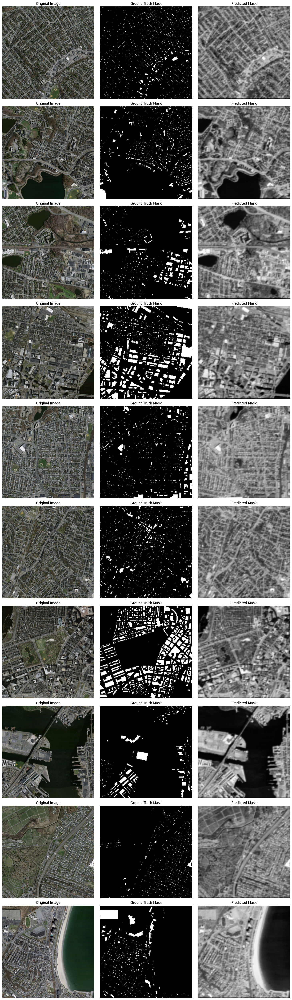

In [10]:

EPOCHS = 3
BATCH_SIZE = 16

# Data augmentation
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.1,
    horizontal_flip=True,
    vertical_flip=True,
    fill_mode='nearest'
)

#Data Augmentation

for image in train_images:
    trans_img = Image.fromarray(image)
    trans_img= trans_img.FLIP_LEFT_RIGHT
    # Display the original image and predicted mask
    plt.figure(figsize=(10, 5))


    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(trans_img, cmap='gray')
    plt.title('Transformed Image')
    plt.axis('off')

    # plt.show()



# Augment and add data to train_images and train_masks arrays
for images, masks in datagen.flow(train_images, train_masks, batch_size=BATCH_SIZE, shuffle=True):
    train_images = np.concatenate([train_images, images], axis=0)
    train_masks = np.concatenate([train_masks, masks], axis=0)
    if len(train_images) >= len(train_masks):
        break  # Stop augmentation when train_masks array is fully augmented

# Create generator for training data
train_generator = datagen.flow(train_images, train_masks, batch_size=BATCH_SIZE)







# Define the model
model = unet()
model.compile(optimizer=Adam(learning_rate=lr_schedule(0)), loss=dice_loss, metrics=['accuracy'])

# Define learning rate scheduler
lr_scheduler = LearningRateScheduler(lr_schedule)

# Train the model
model.fit(train_images, train_masks, epochs=EPOCHS, steps_per_epoch=len(train_images)//BATCH_SIZE, validation_data=(test_images, test_masks), callbacks=[lr_scheduler])

# # Evaluate the model on test data
# test_loss, test_accuracy, test_iou = model.evaluate(test_images, test_masks)
# print(f"Test Loss: {test_loss}, Test Accuracy: {test_accuracy}, Test IoU: {test_iou}")

# Evaluate the model on test data
test_loss = model.evaluate(test_images, test_masks)
print(f"Test Loss: {test_loss}")

# Predict masks for test images
predicted_masks = model.predict(test_images)

# Display results
display_results(test_images, test_masks, predicted_masks)

# Save the model
model.save('building_segmentation_model.keras')

In [ ]:
def convert_jpg_to_png(input_path, output_path):
    try:
        # Open the JPG image
        with Image.open(input_path) as img:
            # Convert the image to PNG format
            img.save(output_path, "PNG")
        print("Conversion successful!")
    except Exception as e:
        print("An error occurred:", e)




1/1 [==============================] - 0s 492ms/step


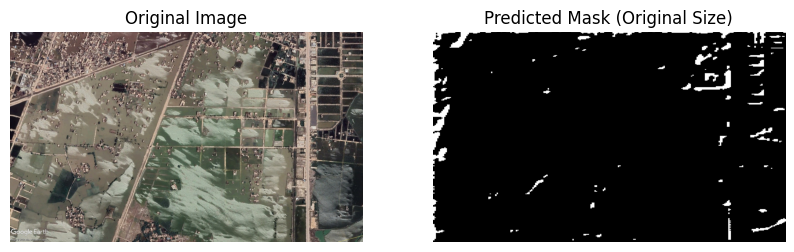

1/1 [==============================] - 0s 311ms/step


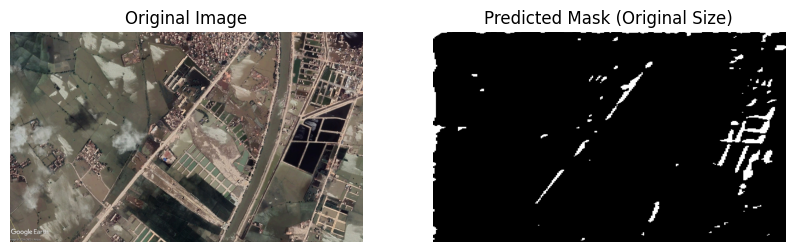

1/1 [==============================] - 0s 300ms/step


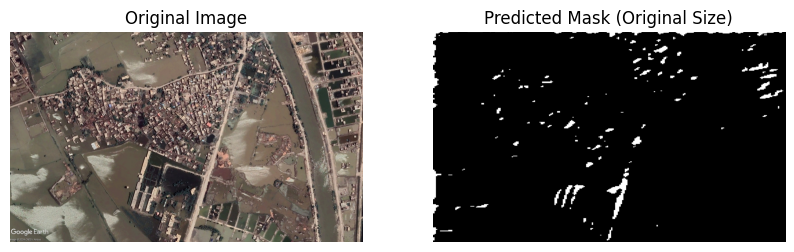

1/1 [==============================] - 0s 300ms/step


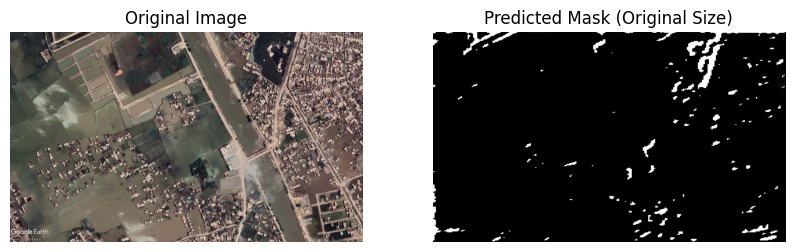

1/1 [==============================] - 0s 323ms/step


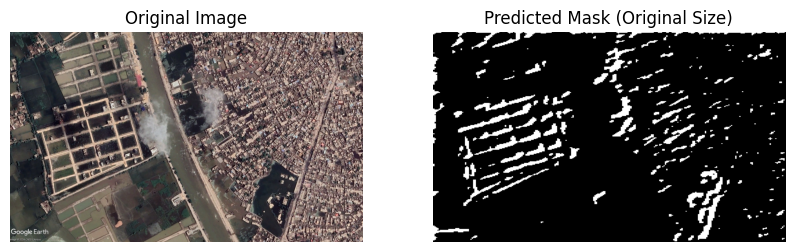

1/1 [==============================] - 0s 306ms/step


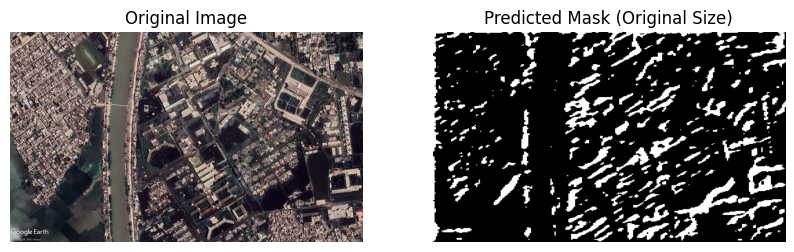

1/1 [==============================] - 0s 299ms/step


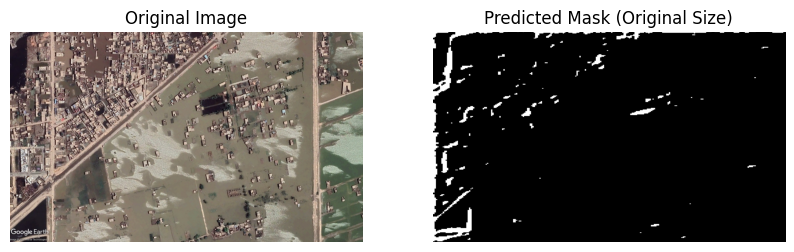

1/1 [==============================] - 0s 304ms/step


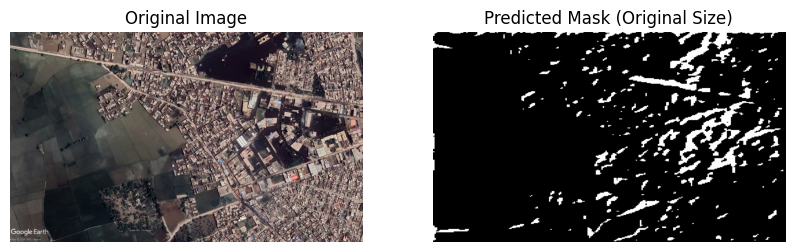

Prediction and saving complete.


In [ ]:

tf.keras.utils.get_custom_objects()['dice_loss'] = dice_loss

# Load the saved model with custom objects
model = load_model('building_segmentation_model.keras', custom_objects={'dice_loss': dice_loss})


# Define input and output directories
input_dir = 'E:\\FAST NUCES\\FYP\\Datasets\\Pakistan Dataset\\Larkana\\Post'
output_dir = 'E:\\FAST NUCES\\FYP\\Datasets\\Pakistan Dataset\\Larkana\\Post\\Segmentation'

# Create the output directory if it does not exist
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Iterate over all images in the input directory
for filename in os.listdir(input_dir):
    if filename.endswith('.jpg') or filename.endswith('.png'):
        # Load the image
        image_path = os.path.join(input_dir, filename)
        original_image = Image.open(image_path)
        resized_image = original_image.resize((256, 256))  # Resize and normalize the image
        image = np.array(resized_image) / 255.0  # Convert to numpy array and normalize

        # Perform inference
        predicted_mask = model.predict(np.expand_dims(image, axis=0))[0]

        # Convert probabilities to binary mask
        threshold = 0.5  # You can adjust this threshold based on your model's performance
        binary_mask = (predicted_mask > threshold).astype(np.uint8) * 255

        # Resize the binary mask back to the original input size
        original_size_mask = cv2.resize(binary_mask, (original_image.width, original_image.height), interpolation=cv2.INTER_NEAREST)

        # Save the predicted mask with the same filename in the output directory
        output_path = os.path.join(output_dir, filename)
        Image.fromarray(original_size_mask).save(output_path)


        # Display the original image and predicted mask
        plt.figure(figsize=(10, 5))

        plt.subplot(1, 2, 1)
        plt.imshow(original_image)
        plt.title('Original Image')
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.imshow(original_size_mask, cmap='gray')
        plt.title('Predicted Mask (Original Size)')
        plt.axis('off')

        plt.show()

print("Prediction and saving complete.")



Difference images created.


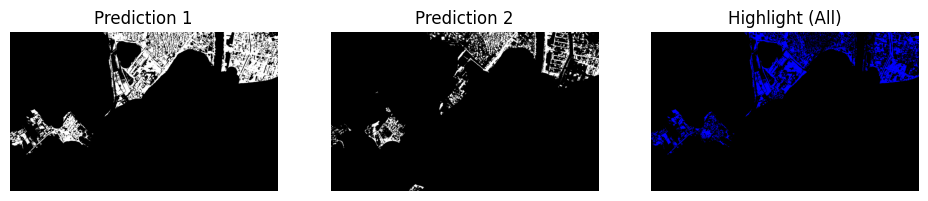

In [ ]:
import os
import cv2

# Define input directories for both sets of images
image_dir_1 = 'E:\\FAST NUCES\\FYP\\Datasets\\Pakistan Dataset\\Larkana\\Pre\\Labels'
image_dir_2 = 'E:\\FAST NUCES\\FYP\\Datasets\\Pakistan Dataset\\Larkana\\Post\\Labels'

# Define output directory for the difference images
difference_output_dir = 'E:\\FAST NUCES\\FYP\\Datasets\\Testing\\Difference'

# Create the difference output directory if it does not exist
if not os.path.exists(difference_output_dir):
    os.makedirs(difference_output_dir)

# Iterate over all images in the image directories
for filename in os.listdir(image_dir_1):
    if filename.endswith('.jpg'):  # Assuming the images are JPEG files
        # Load the images from both directories
        image_path_1 = os.path.join(image_dir_1, filename)
        image_path_2 = os.path.join(image_dir_2, filename)
        
        if not os.path.exists(image_path_2):
            continue  # Skip if corresponding image file not found
        
        image1 = cv2.imread(image_path_1)
        image2 = cv2.imread(image_path_2)

        # Compute the difference between the images
        difference = cv2.subtract(image1, image2)

        # Color the differing pixels in red
        Conv_hsv_Gray = cv2.cvtColor(difference, cv2.COLOR_BGR2GRAY)
        ret, mask = cv2.threshold(Conv_hsv_Gray, 0, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)
        difference[mask != 255] = [0, 0, 255]

        # Save the difference image
        difference_output_filename = os.path.splitext(filename)[0] + '_difference.png'
        difference_output_path = os.path.join(difference_output_dir, difference_output_filename)
        cv2.imwrite(difference_output_path, difference)

        # Display the original image and predicted mask
        plt.figure(figsize=(20, 5))

        plt.subplot(1, 5, 1)
        plt.imshow(image1)
        plt.title('Prediction 1')
        plt.axis('off')

        plt.subplot(1, 5, 2)
        plt.imshow(image2)
        plt.title('Prediction 2')
        plt.axis('off')

        plt.subplot(1, 5, 3)
        plt.imshow(difference)
        plt.title('Highlight (All)')
        plt.axis('off')

print("Difference images created.")


In [ ]:
from PIL import Image, ImageChops
import numpy as np
import os

# Define input directories for both sets of images
image_dir_1 = 'E:\\FAST NUCES\\FYP\\Datasets\\Pakistan Dataset\\Larkana\\Pre\\Labels'
image_dir_2 = 'E:\\FAST NUCES\\FYP\\Datasets\\Pakistan Dataset\\Larkana\\Post\\Labels'

# Define output directory for the difference images
difference_output_dir = 'E:\\FAST NUCES\\FYP\\Datasets\\Testing\\Difference'

# Create the difference output directory if it does not exist
if not os.path.exists(difference_output_dir):
    os.makedirs(difference_output_dir)

# Define density thresholds
high_density_threshold = 0.7
medium_density_threshold = 0.5

# Iterate over all images in the image directory
for filename in os.listdir(image_dir_1):
    if filename.endswith('.jpg'):  # Assuming the images are JPEG files
        # Load the images from both directories
        image_path_1 = os.path.join(image_dir_1, filename)
        image_path_2 = os.path.join(image_dir_2, filename)
        
        if not os.path.exists(image_path_2):
            continue  # Skip if corresponding image file not found
        
        img1 = Image.open(image_path_1)
        img2 = Image.open(image_path_2)

        # Compute the difference between the images
        diff = ImageChops.difference(img1, img2)

        # Convert difference image to numpy array for density calculations
        diff_array = np.array(diff)

        # Initialize an empty image with the same size as the difference image
        colored_image = Image.new('RGBA', diff.size, (0, 0, 0, 0))

        # Iterate over each pixel in the difference image
        for y in range(diff.height):
            for x in range(diff.width):
                # Calculate density of changed pixels in the neighborhood of the current pixel
                neighborhood = diff_array[max(0, y - 1):min(diff.height, y + 2),
                                          max(0, x - 1):min(diff.width, x + 2)]
                density = np.count_nonzero(neighborhood) / (neighborhood.shape[0] * neighborhood.shape[1])

                # Define colors based on density thresholds
                if density >= high_density_threshold:
                    color = (200, 0, 0, 255)  # Red for high density
                elif density >= medium_density_threshold:
                    color = (255, 150, 0, 255)  # Orange for medium density
                elif  density != 0:
                    color = (255, 255, 0, 255)  # Yellow for low density
                else: 
                    color = (0,0,0, 0)  # Transparent for black pixels

                # Set the color of the current pixel in the colored image
                colored_image.putpixel((x, y), color)

        # Save the difference image in PNG format
        difference_output_path = os.path.join(difference_output_dir, os.path.splitext(filename)[0] + '.png')
        colored_image.save(difference_output_path)

        # Display the difference image
        colored_image.show()

print("Difference images created and displayed.")


Difference images created and displayed.
